## M11-L2 Problem 1

In this problem you will implement the elbow method using three different sklearn clustering algorithms: (`KMeans`, `SpectralClustering`, `GaussianMixture`). You will use the algorithms to find the number of natural clusters for two different datasets, one "blob" shaped dataset, and one concetric circle dataset.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200

from sklearn.datasets import make_blobs, make_circles
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.mixture import GaussianMixture

def plot_loss(loss, ax = None, title = None):
    if ax is None:
        ax = plt.gca()
    ax.plot(np.arange(2, len(loss)+2), loss, 'k-o')
    ax.set_xlabel('Number of Clusters')
    ax.set_ylabel('Loss')
    if title:
        ax.set_title(title)
    return ax

def plot_pred(x, labels, ax = None, title = None):
    if ax is None:
        ax = plt.gca()
    n_clust = len(np.unique(labels))
    for i in range(n_clust):
        ax.scatter(x[labels == i,0], x[labels == i,1], alpha = 0.5)
    ax.set_title(title)
    return ax

def compute_loss(x, labels):
    # Initialize loss
    loss = 0
    # Number of clusters
    n_clust = len(np.unique(labels))
    # Loop through the clusters
    for i in range(n_clust):
        # Compute the center of a given label
        center = np.mean(x[labels == i, :], axis = 0)
        # Compute the sum of squared distances between each point and its corresponding cluster center
        loss += np.sum(np.linalg.norm(x[labels == i, :] - center, axis = 1)**2)
    return loss


## Blob dataset

Visualize the "blob" dataset generated below, using a unique color for each cluster of points, where `y` contains the label of each corresponding point in `x`.

In [3]:
## DO NOT MODIFY
x, y = make_blobs(n_samples = 1000, n_features = 2, centers = [[0,0],[2,2],[1,-2],[4,0],[-2,-1],[-1,3]], cluster_std = [0.6,0.4,0.6,1.5,0.3,0.8], random_state = 0)

<Axes: title={'center': 'Ground Truth'}>

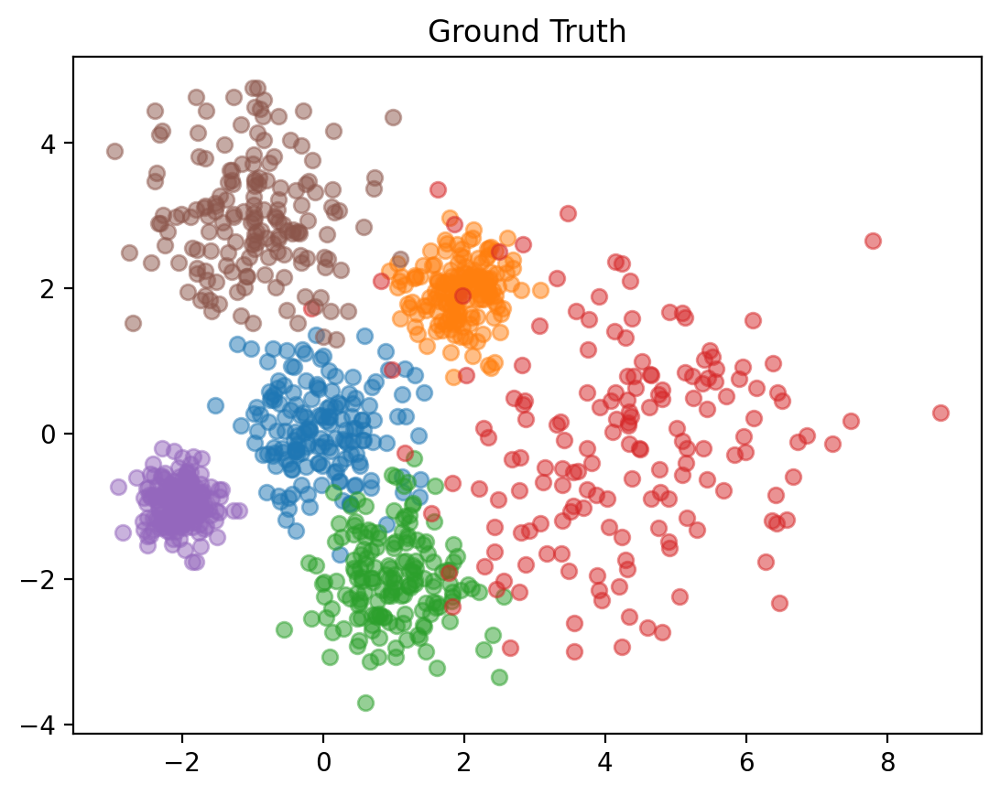

In [6]:
fig, ax = plt.subplots()
plot_pred(x, y, ax, "Ground Truth")

Use the `sklearn` KMeans, Spectral Clustering, and Gaussian Mixture Model functions to cluster the "blob" data with 6 clusters, and modify the parameters until you get satisfactory results. Plot the results of your three models side-by-side using `plt.subplots` and the provided `plot_pred(x, labels, ax, title)` function.

<Axes: title={'center': 'Gaussian Mixture'}>

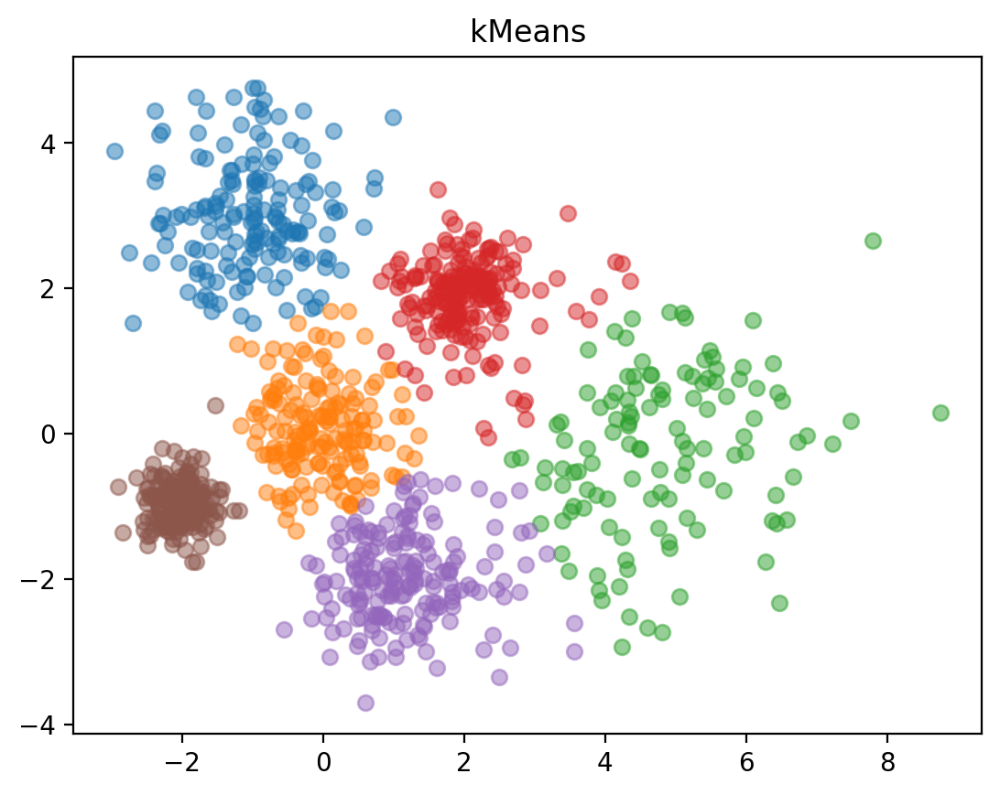

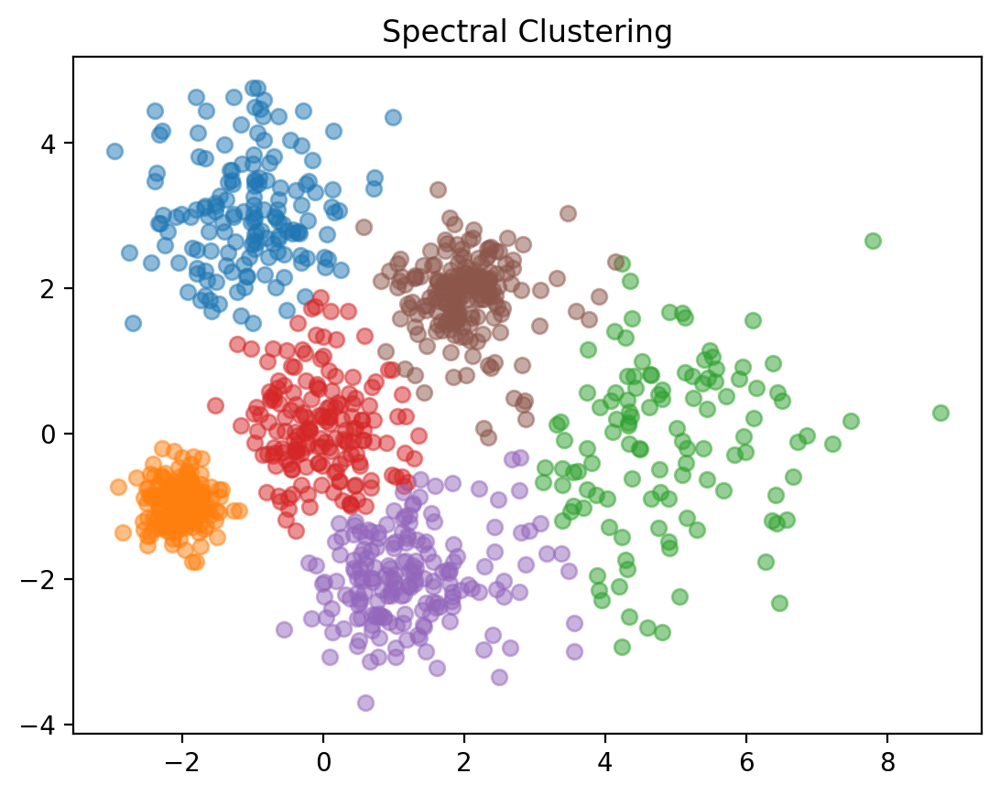

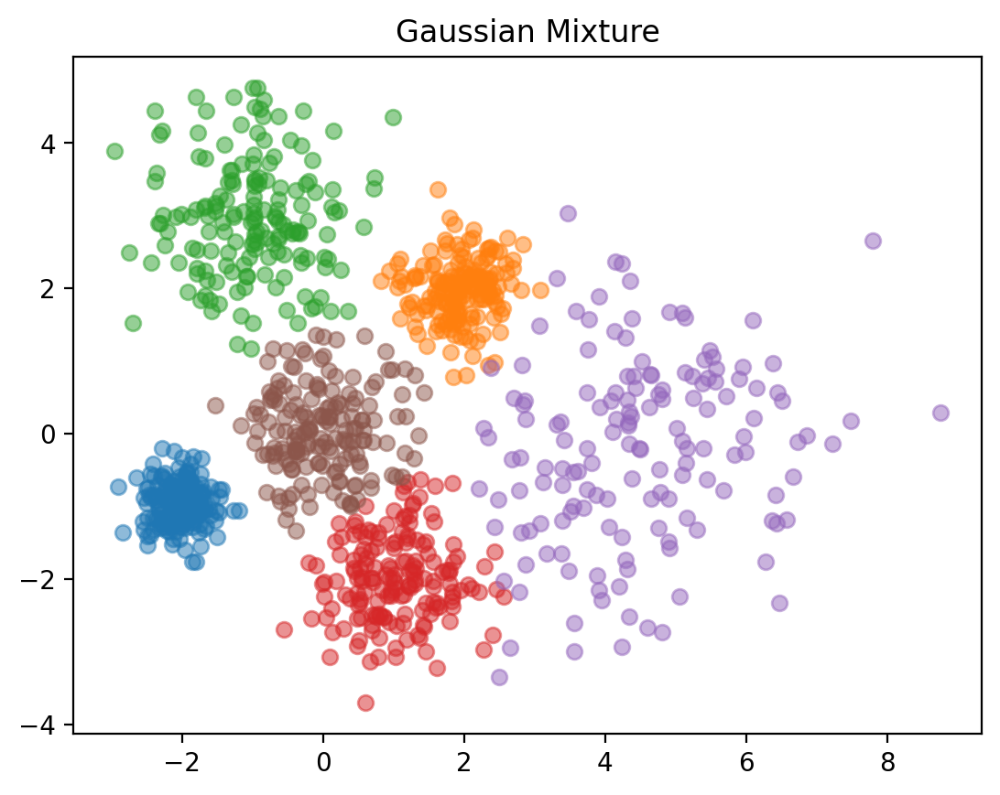

In [8]:
fig, ax = plt.subplots()
model1 = KMeans(n_clusters=6, n_init=10).fit(x)
plot_pred(x, model1.labels_, ax, "kMeans")

fig, ax = plt.subplots()
model2 = SpectralClustering(n_clusters=6, n_init=10).fit(x)
plot_pred(x, model2.labels_, ax, "Spectral Clustering")

fig, ax = plt.subplots()
model3 = GaussianMixture(n_components=6, n_init=10).fit(x)
plot_pred(x, model3.predict(x), ax, "Gaussian Mixture")

Using the parameters you found for the three models above, run each of the clustering algorithms for `n_clust = [2,3,4,5,6,7,8,9]` and compute the sum of squared distances loss for each case using the provided `compute_loss(x, labels)` function, where labels is the cluster assigned to each point by the algorithm. Plot loss versus number of cluster for each your three models in side-by-side subplots using the provided `plot_pred(x, labels, ax, title)` function.

<Axes: title={'center': 'Gaussian Mixture Sum Square Dist'}, xlabel='Number of Clusters', ylabel='Loss'>

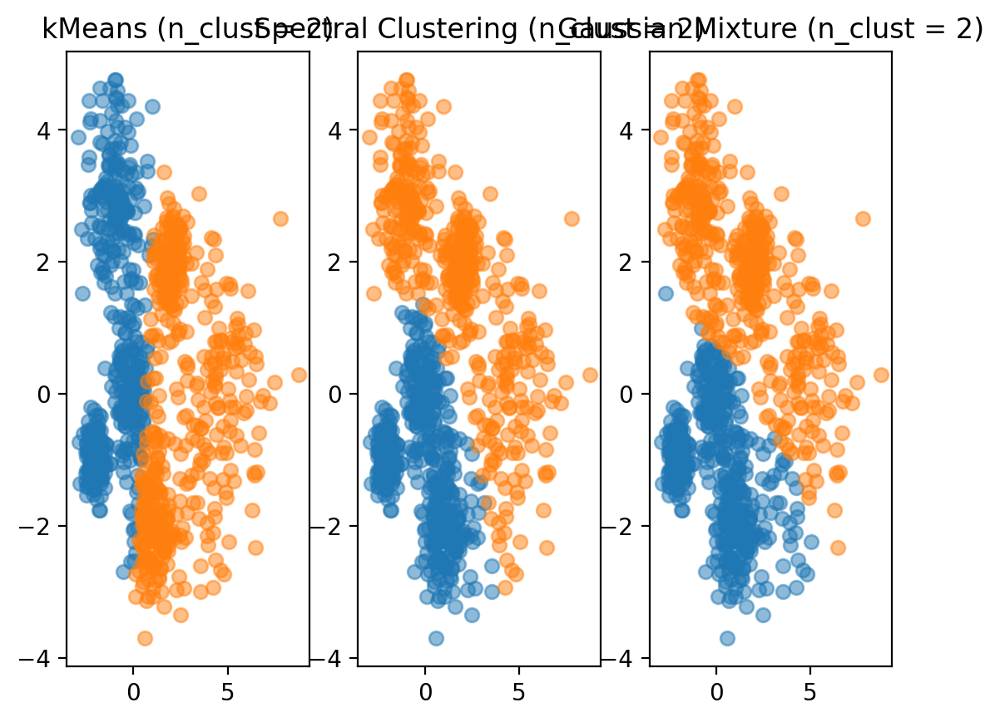

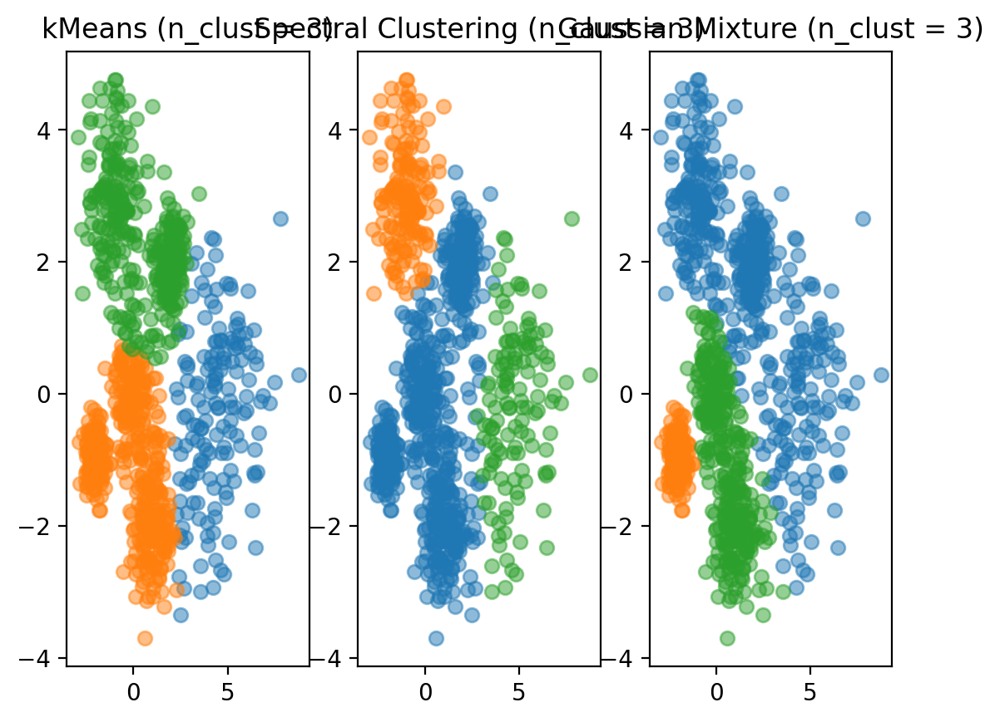

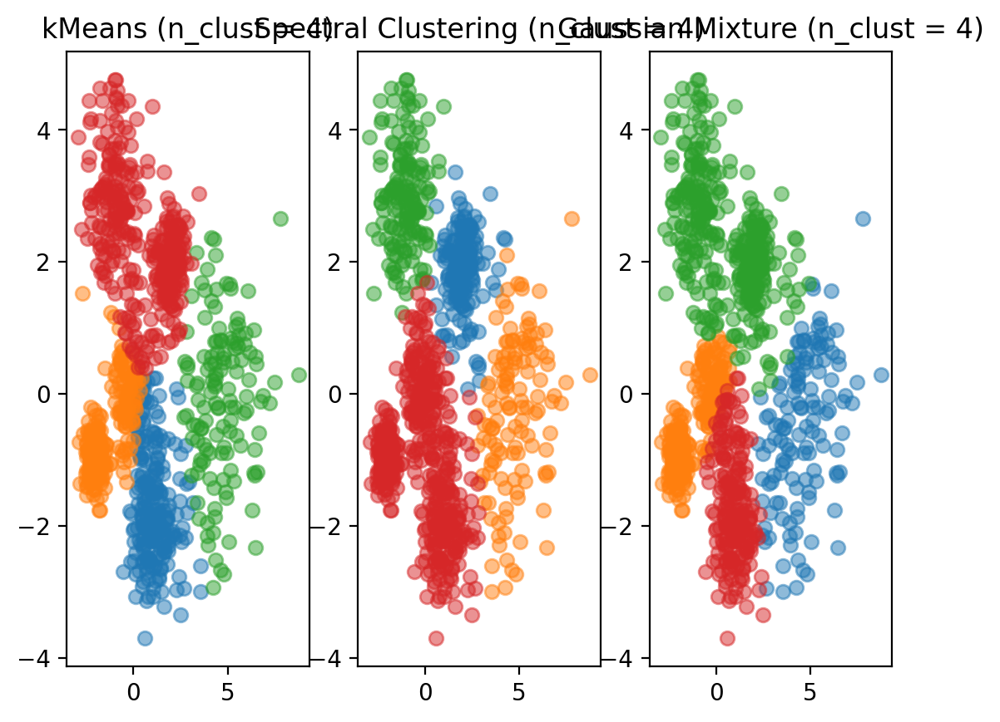

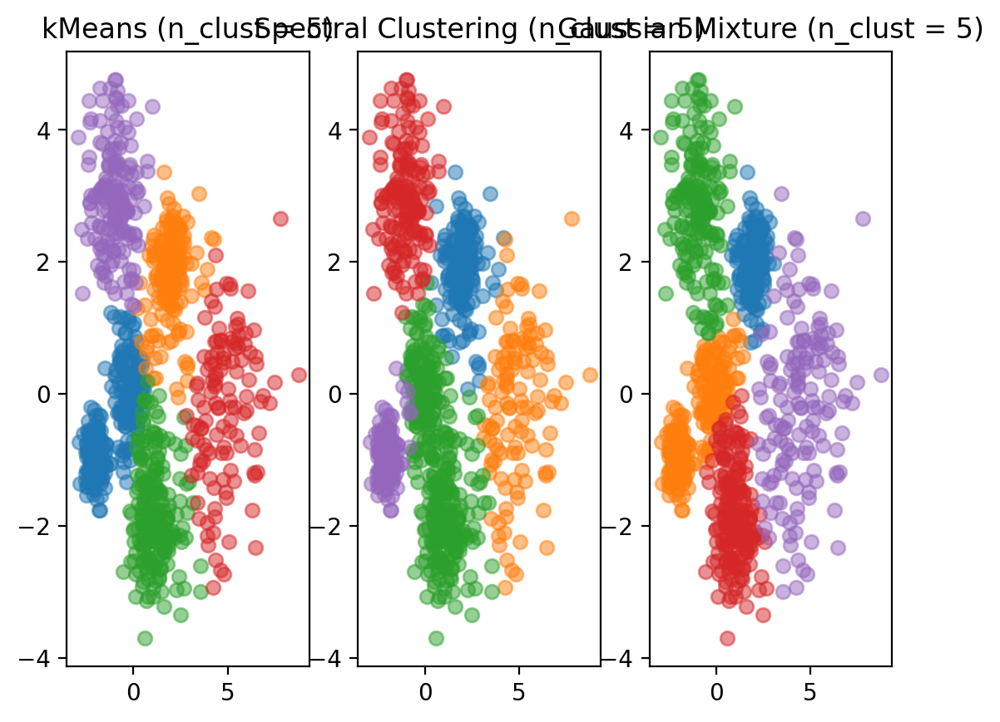

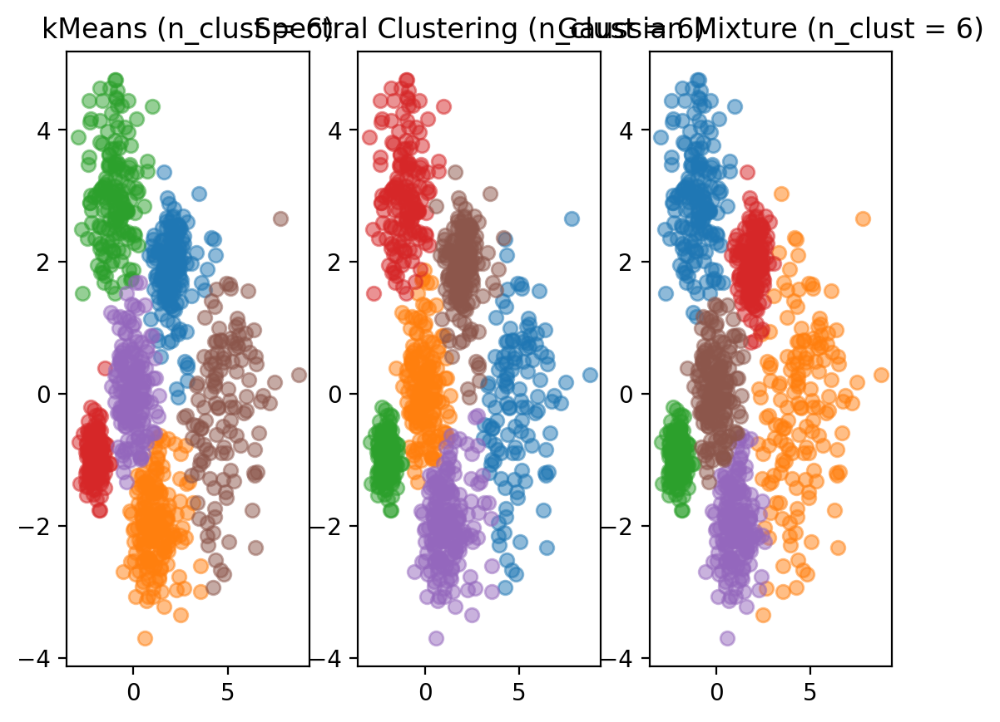

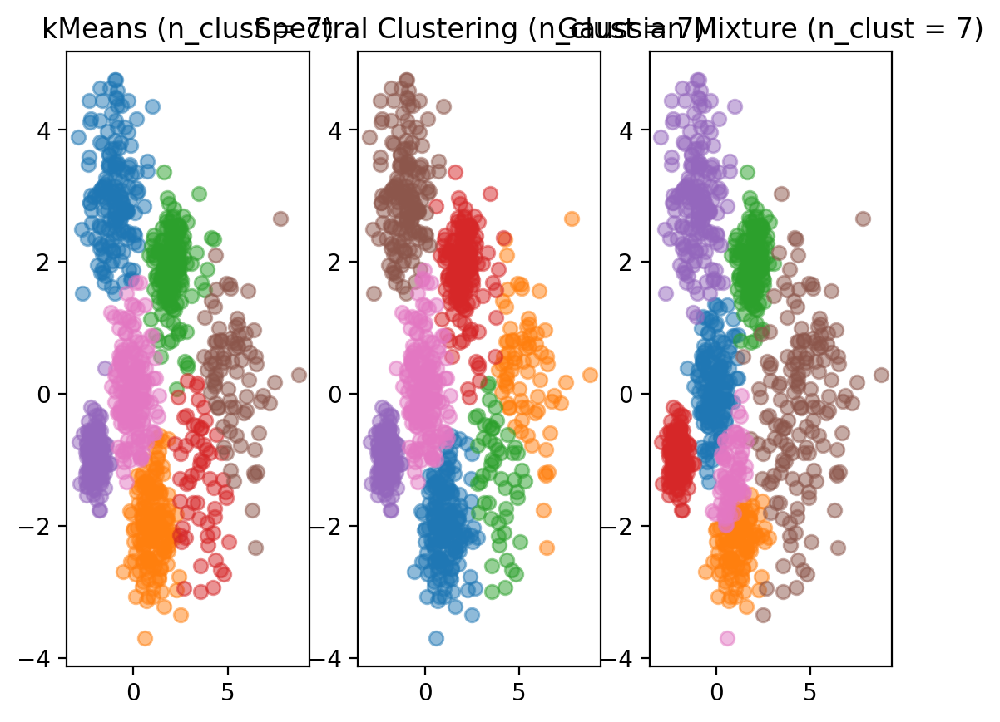

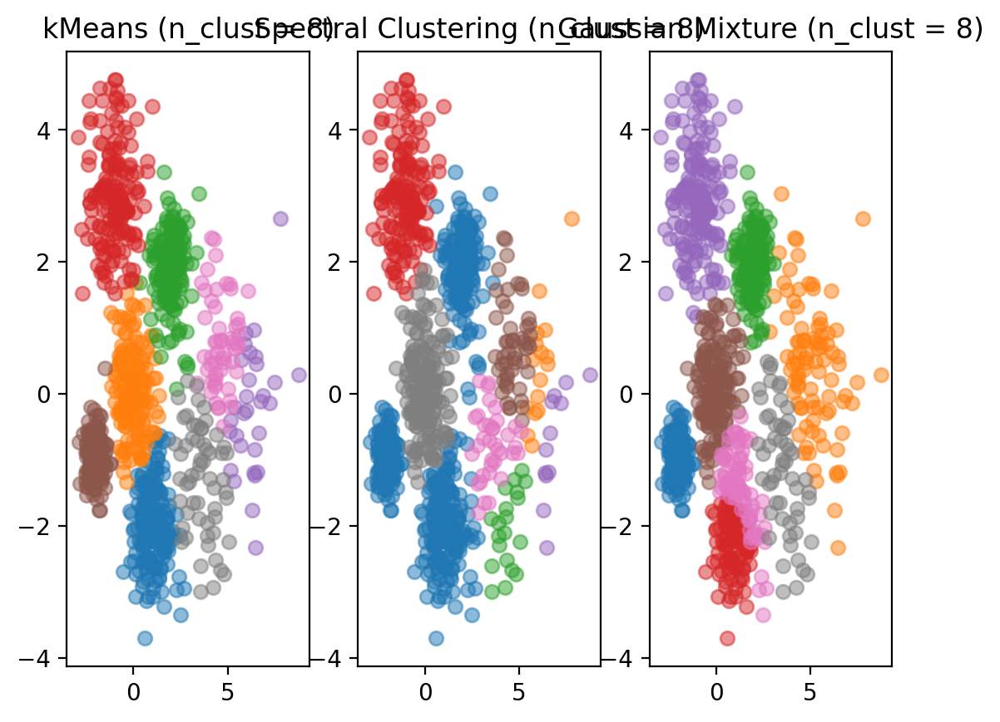

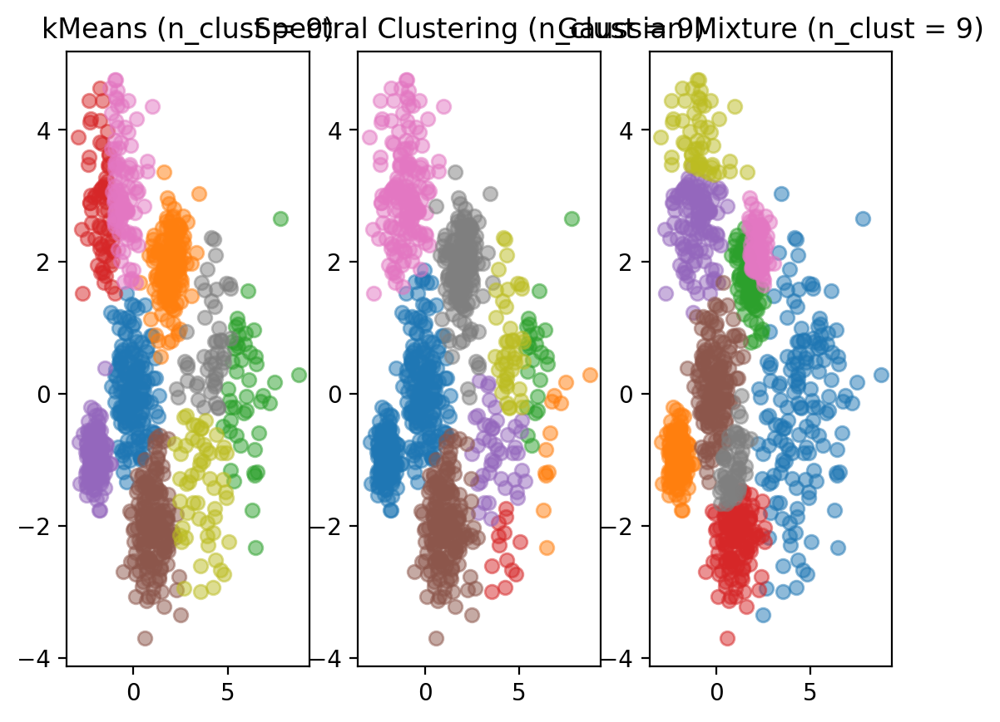

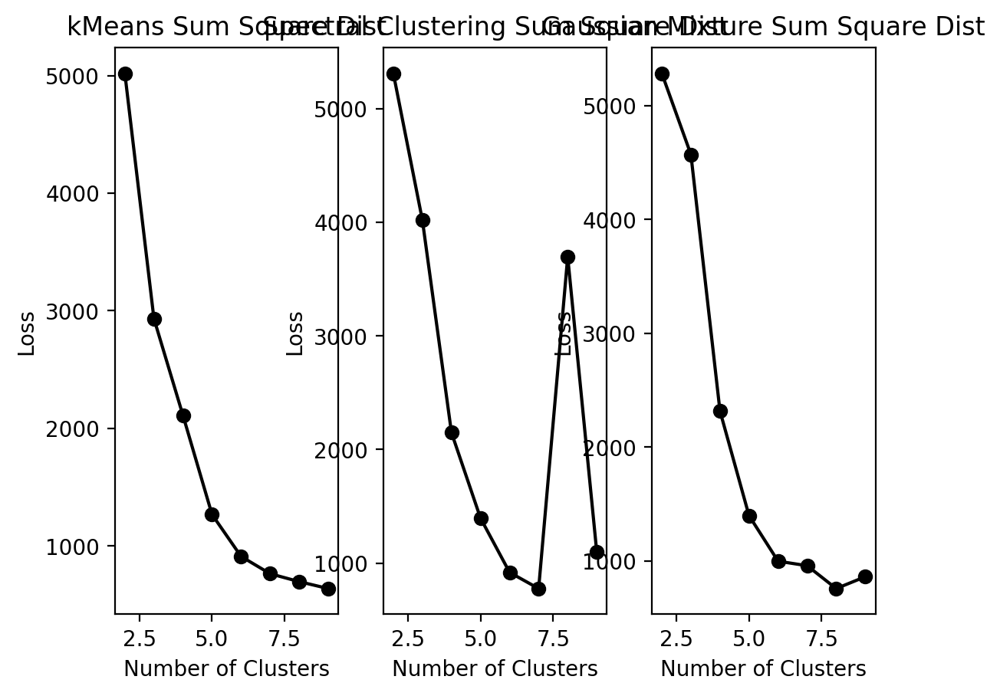

In [9]:
## YOUR CODE GOES HERE
model1_sum_square_dist = []
model2_sum_square_dist = []
model3_sum_square_dist = []

for n_clust in [2, 3, 4, 5, 6, 7, 8, 9]:
    #Train models
    model1 = KMeans(n_clusters=n_clust, n_init=10).fit(x)
    model2 = SpectralClustering(n_clusters=n_clust, n_init=10).fit(x)
    model3 = GaussianMixture(n_components=n_clust, n_init=10).fit(x)

    model1_sum_square_dist.append(compute_loss(x, model1.labels_))
    model2_sum_square_dist.append(compute_loss(x, model2.labels_))
    model3_sum_square_dist.append(compute_loss(x, model3.predict(x)))

    fig, ax = plt.subplots(1,3)
    plot_pred(x, model1.labels_, ax[0], f"kMeans (n_clust = {n_clust})")
    plot_pred(x, model2.labels_, ax[1], f"Spectral Clustering (n_clust = {n_clust})")
    plot_pred(x, model3.predict(x), ax[2], f"Gaussian Mixture (n_clust = {n_clust})")

fig, ax = plt.subplots(1,3)
plot_loss(model1_sum_square_dist, ax[0], "kMeans Sum Square Dist")
plot_loss(model2_sum_square_dist, ax[1], "Spectral Clustering Sum Square Dist")
plot_loss(model3_sum_square_dist, ax[2], "Gaussian Mixture Sum Square Dist")

## Concentric circles dataset
Visualize the "blob" dataset generated below, using a unique color for each cluster of points, where `y` contains the label of each corresponding point in `x`.

In [10]:
## DO NOT MODIFY
x1, y1 = make_circles(n_samples = 400, noise = 0.05, factor = 0.5, random_state = 0)
x2, y2 = make_circles(n_samples = 800, noise = 0.025, factor = 0.75, random_state = 1)

x = np.vstack([x1, x2*2])
y = np.hstack([y1, y2+2])

<Axes: title={'center': 'Ground Truth'}>

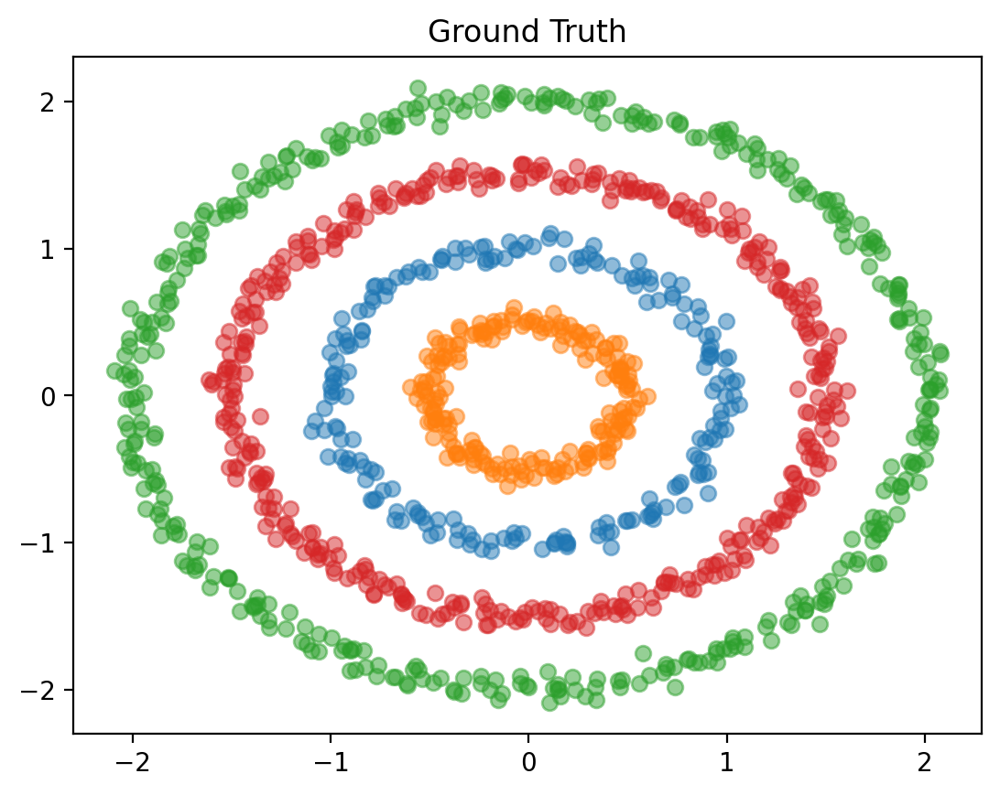

In [11]:
## YOUR CODE GOES HERE
fig, ax = plt.subplots()
plot_pred(x, y, ax, "Ground Truth")

Use the `sklearn` KMeans, Spectral Clustering, and Gaussian Mixture Model functions to cluster the concentric circle data with 4 clusters, and attempt to modify the parameters until you get satisfactory results. Note: you should get good clustering results with Spectral Clustering, but the KMeans and GMM models will struggle to cluster this dataset well. Plot the results of your three models side-by-side using `plt.subplots` and the provided `plot_pred(x, labels, ax, title)` function.

/opt/conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


<Axes: title={'center': 'Gaussian Mixture'}>

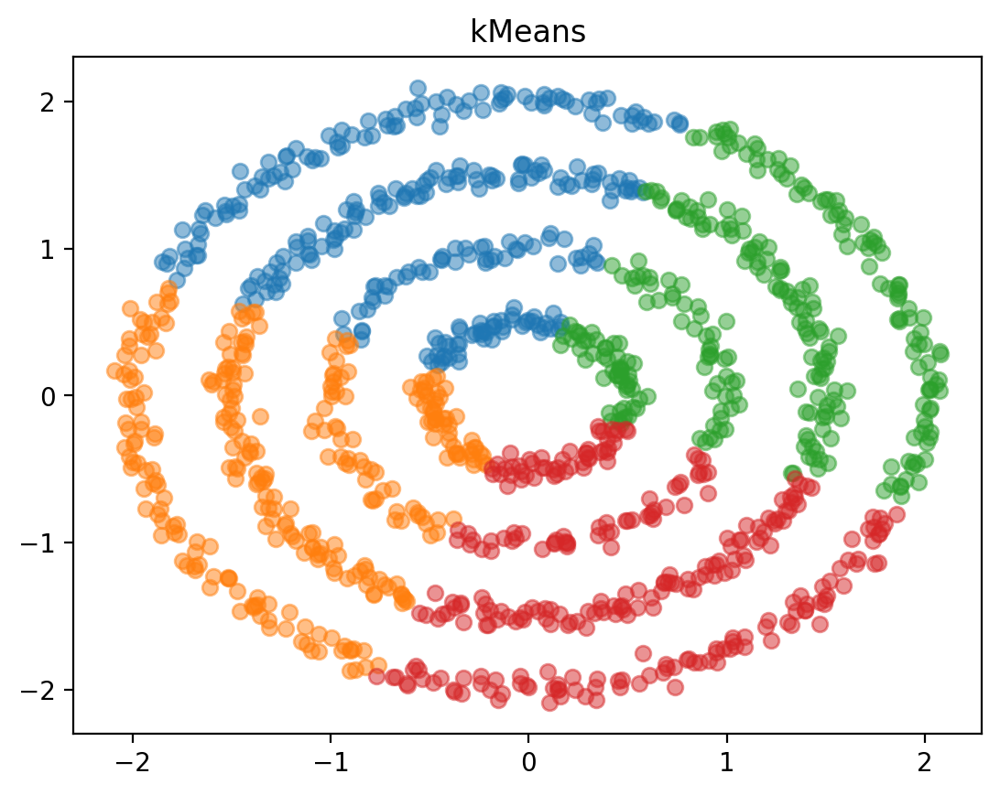

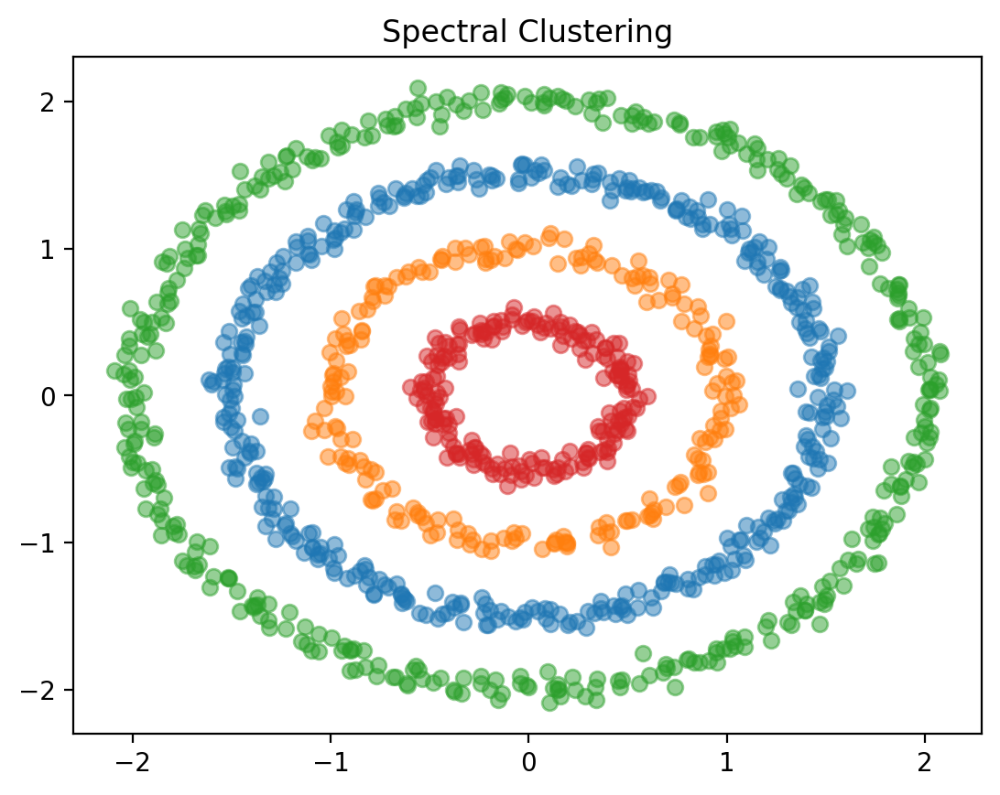

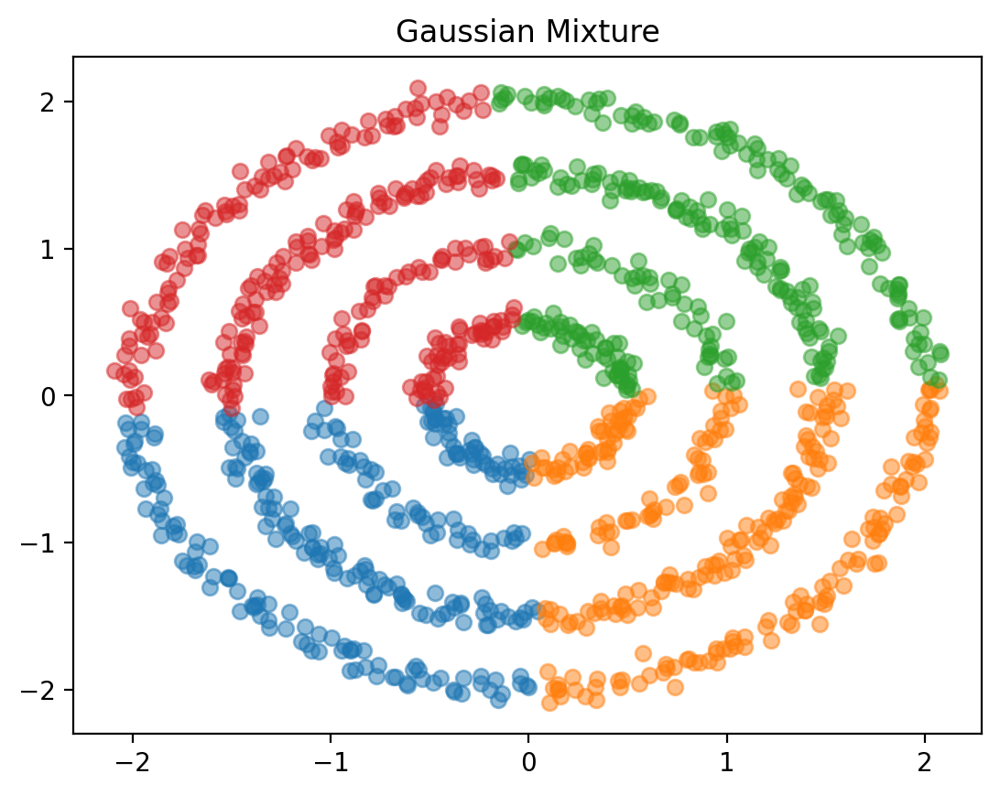

In [20]:
## YOUR CODE GOES HERE
fig, ax = plt.subplots()
model1 = KMeans(n_clusters=4, n_init='auto').fit(x)
plot_pred(x, model1.labels_, ax, "kMeans")

fig, ax = plt.subplots()
model2 = SpectralClustering(n_clusters=4, affinity='nearest_neighbors', n_neighbors=10).fit(x)
plot_pred(x, model2.labels_, ax, "Spectral Clustering")

fig, ax = plt.subplots()
model3 = GaussianMixture(n_components=4, covariance_type='spherical').fit(x)
plot_pred(x, model3.predict(x), ax, "Gaussian Mixture")

Using the parameters you found for the three models above, run each of the clustering algorithms for `n_clust = [2,3,4,5,6,7,8,9]` and compute the sum of squared distances loss for each case using the provided `compute_loss(x, labels)` function, where labels is the cluster assigned to each point by the algorithm. Plot loss versus number of cluster for each your three models in side-by-side subplots using the provided `plot_pred(x, labels, ax, title)` function.

/opt/conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/ma

<Axes: title={'center': 'Gaussian Mixture Sum Square Dist'}, xlabel='Number of Clusters', ylabel='Loss'>

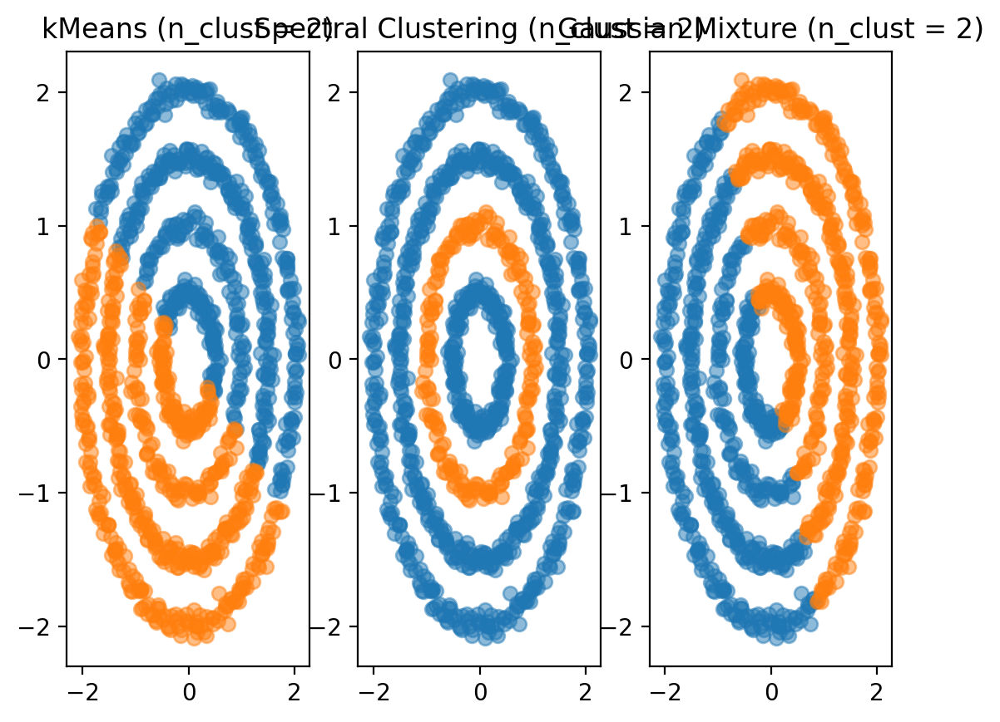

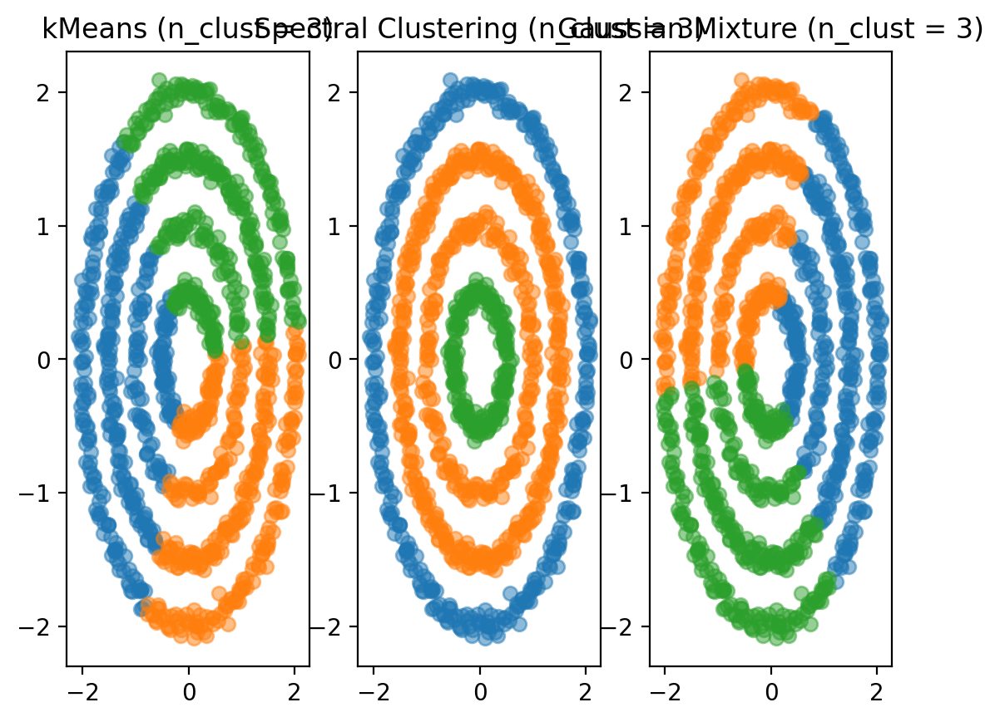

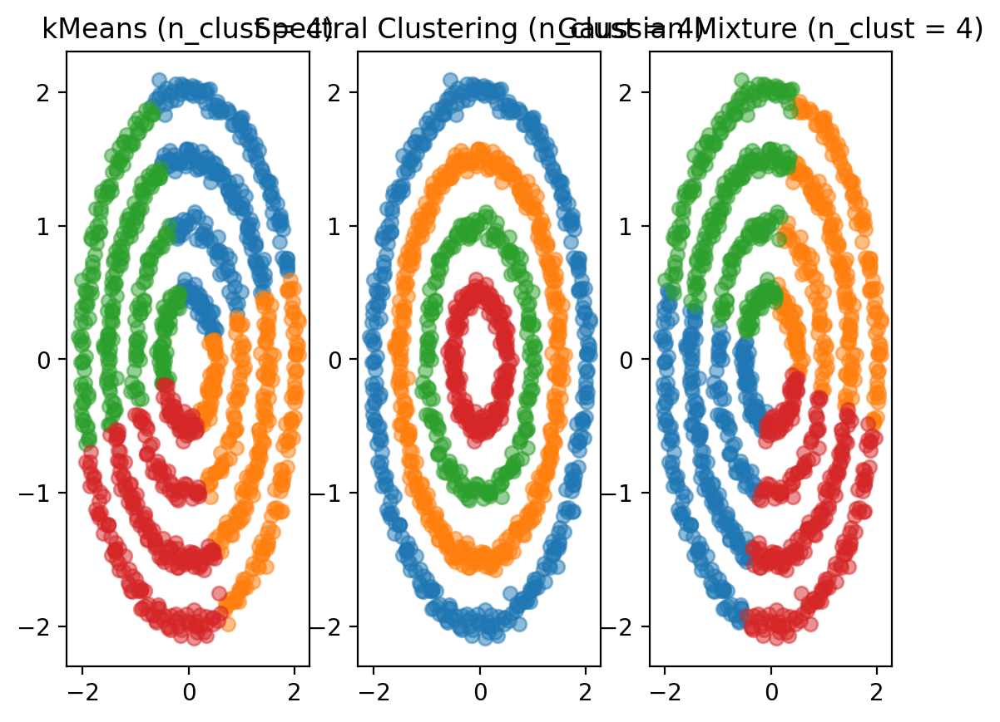

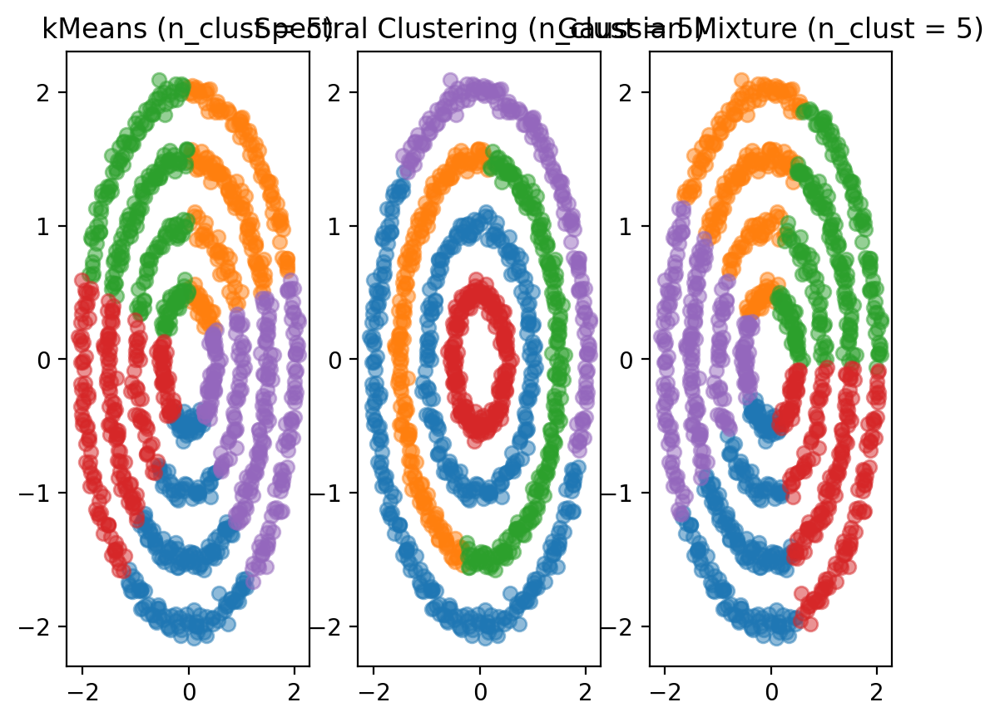

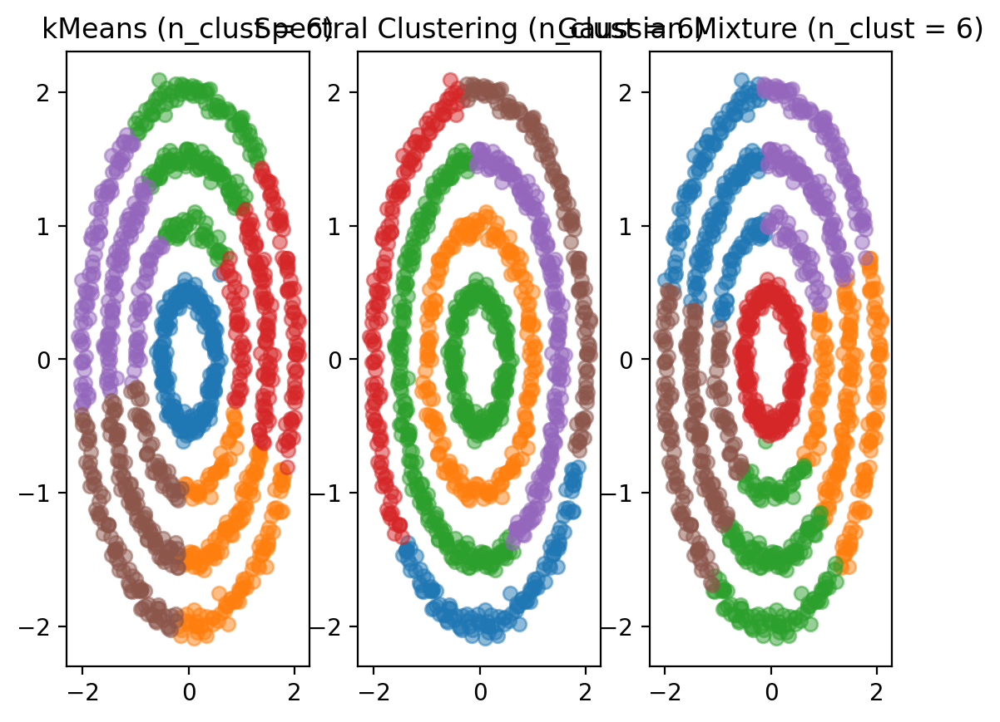

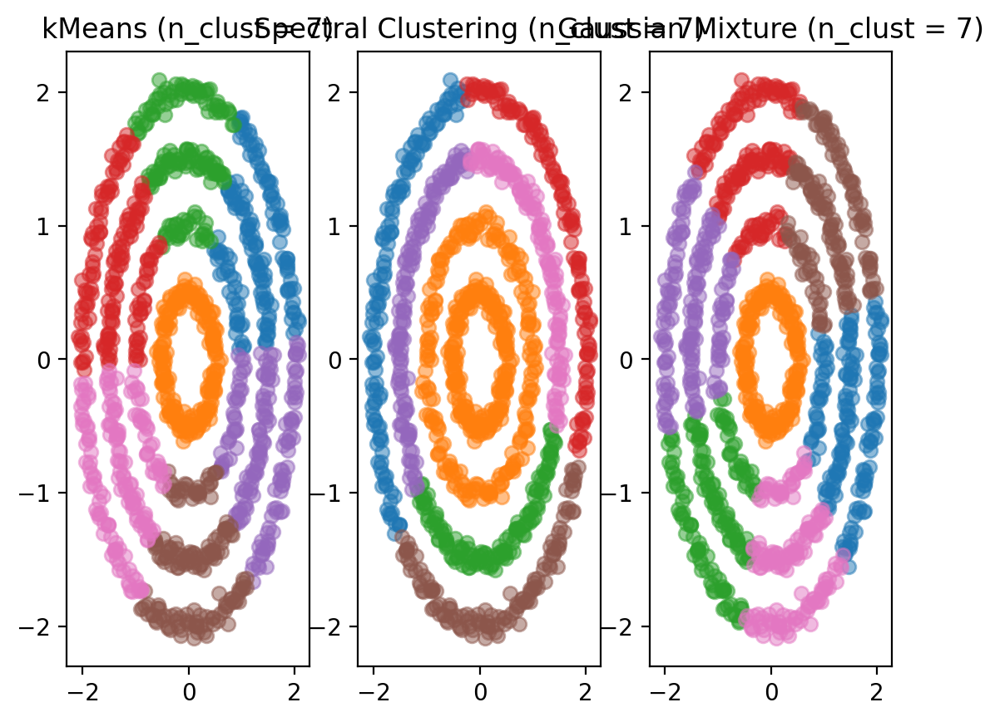

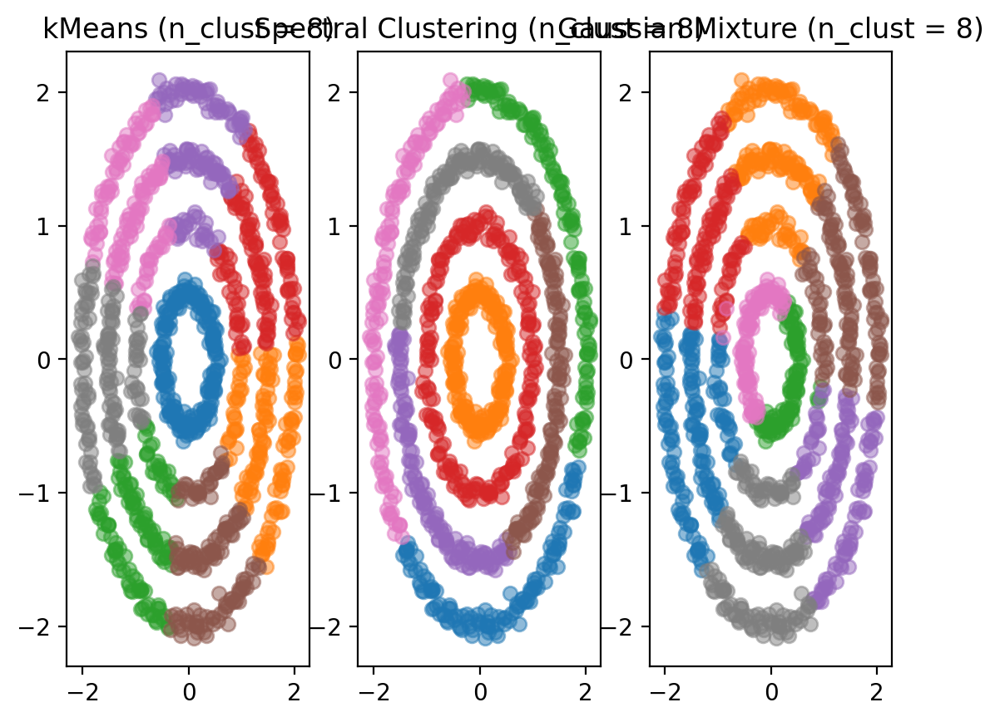

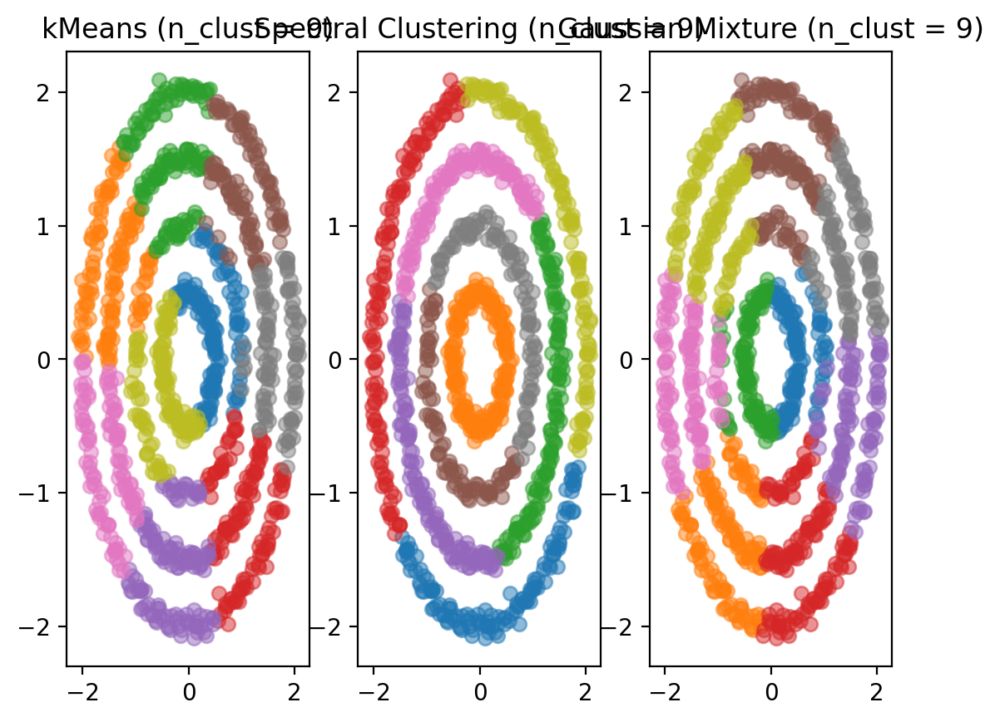

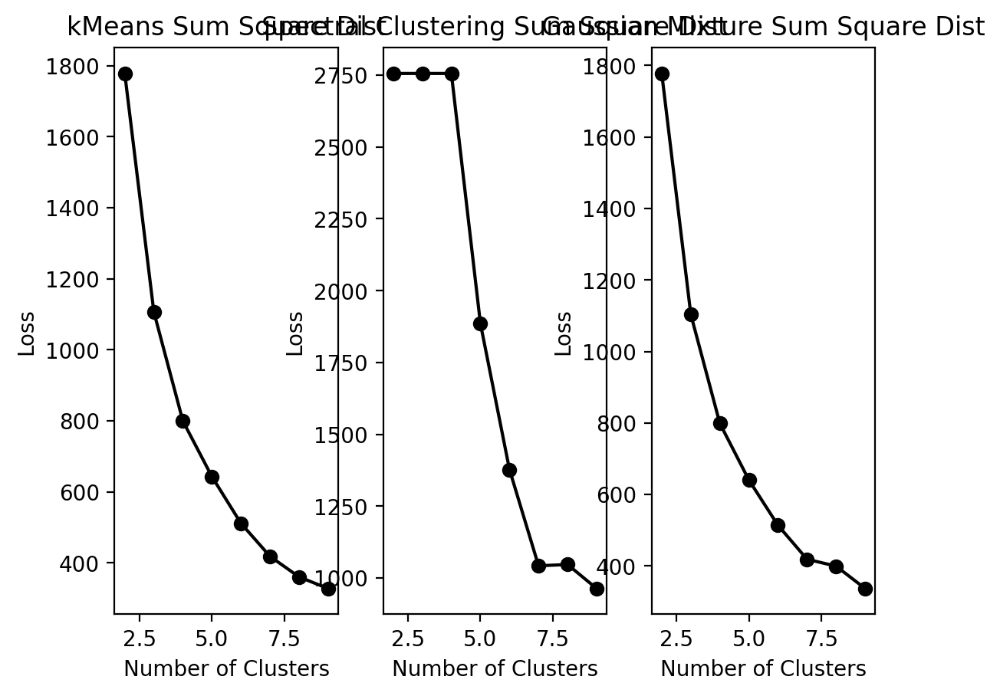

In [19]:
## YOUR CODE GOES HERE
model1_sum_square_dist = []
model2_sum_square_dist = []
model3_sum_square_dist = []

for n_clust in [2, 3, 4, 5, 6, 7, 8, 9]:
    #Train models
    model1 = KMeans(n_clusters=n_clust, n_init='auto').fit(x)
    model2 = SpectralClustering(n_clusters=n_clust, affinity='nearest_neighbors', n_neighbors=10).fit(x)
    model3 = GaussianMixture(n_components=n_clust, covariance_type='spherical').fit(x)

    model1_sum_square_dist.append(compute_loss(x, model1.labels_))
    model2_sum_square_dist.append(compute_loss(x, model2.labels_))
    model3_sum_square_dist.append(compute_loss(x, model3.predict(x)))

    fig, ax = plt.subplots(1,3)
    plot_pred(x, model1.labels_, ax[0], f"kMeans (n_clust = {n_clust})")
    plot_pred(x, model2.labels_, ax[1], f"Spectral Clustering (n_clust = {n_clust})")
    plot_pred(x, model3.predict(x), ax[2], f"Gaussian Mixture (n_clust = {n_clust})")

fig, ax = plt.subplots(1,3)
plot_loss(model1_sum_square_dist, ax[0], "kMeans Sum Square Dist")
plot_loss(model2_sum_square_dist, ax[1], "Spectral Clustering Sum Square Dist")
plot_loss(model3_sum_square_dist, ax[2], "Gaussian Mixture Sum Square Dist")

## Discussion

1. Discuss the performance of the clustering algorithms on the "blob" dataset. Using the elbow method, were you able to identify the number of natural clusters in the dataset for each of the methods? Does the elbow method work better for some algorithms versus others?

The elbow method works better to identify the number of natural clusters in KMeans, but didn't do well on Spectral clustering and GMM. 

2. Discuss the performance of the clustering algorithms on the concentric circles dataset. Using the elbow method, were you able to identify the number of natural clusters in the dataset for each of the methods?

The elbow method was not useful at all for determing the number of clusters in the concentric dataset. The best model seperated the data was spectral clustering method, the other 2 methods did not seperate the data well.

3. Does the sum of squared distances work well as a loss function for each of the three clustering algorithms we implemented? Does the sum of squared distance fail on certain types of clusters?

The sum of squares method works well for the blob datasets but not on the concentric datasets. It does not have too much advantage for the Spectral Clustering or the GMM. 